In [12]:
import numpy as np
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import Dense, Dropout, Embedding, LSTM, Bidirectional
import pandas as pd
import pickle

import tensorflow as tf
import os
import numpy as np
import pandas as pd
from tensorflow import keras

# import tensorflow as tf
from keras.layers import Dense, Conv2D, MaxPool2D , Flatten
from keras.models import Model



#importing tensorflow
from tensorflow.keras.layers import Dense,Input,Activation,Dropout,Flatten,MaxPool1D,concatenate,Embedding,BatchNormalization
from keras.layers import CuDNNLSTM,SpatialDropout1D,GlobalMaxPooling1D,GlobalAveragePooling1D,Concatenate,Add,CuDNNGRU
from tensorflow.keras.models import Model,Sequential
import random as rn


import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.optimizers import Adam

from sklearn.metrics import confusion_matrix
import itertools
import os
import shutil
import random

import matplotlib.pyplot as plt
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
%matplotlib inline
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

> lets prepare data first 

In [1]:
import pandas as pd

In [2]:
Train_Final_pre_text_data_DL = pd.read_csv(r"C:\Users\Lenovo\Downloads\Self case study 2\Train_Final_pre_text_data_DL_1.csv")

In [9]:
x= Train_Final_pre_text_data_DL[(Train_Final_pre_text_data_DL['class']=='toxic')]

In [11]:
x['comment_text'].values[1:20]

array(['ur a sh*tty comment.',
       'It\'s ridiculous that these guys are being called "protesters". Being armed is a threat of violence, which makes them terrorists.',
       "This story gets more ridiculous by the hour! And, I love that people are sending these guys dildos in the mail now. But… if they really think there's a happy ending in this for any of them, I think they're even more deluded than all of the jokes about them assume.",
       'Angry trolls, misogynists and Racists", oh my. It doesn\'t take all of my 150 IQ to see the slant here.  it\'s the "Diversity diode" at work yet again. "We can say anything that we want because we are Diversity. You on the other hand must only  say what we allow you to say. From now on, winning arguments against any member of diversity will be considered offensive language.  facts, cogent, linear posts and Math are now verboten.',
       "Yet call out all Muslims for the acts of a few will get you pilloried.   So why is it okay to smear an 

In [12]:
Train_Final_pre_text_data_DL

,id,target,comment_text,severe_toxicity,obscene,identity_attack,insult,threat,asian,atheist,...,funny,wow,sad,likes,disagree,sexual_explicit,identity_annotator_count,toxicity_annotator_count,comment_text_pre,class
0,59848,0.000000,"This is so cool. It's like, 'would you want yo...",0.000000,0.000000,0.000000,0.000000,0.0,NaN,NaN,...,0,0,0,0,0,0.0,0,4,cool like want mother read really great idea w...,non-toxic
1,59849,0.000000,Thank you!! This would make my life a lot less...,0.000000,0.000000,0.000000,0.000000,0.0,NaN,NaN,...,0,0,0,0,0,0.0,0,4,thank would make life lot less keep not let an...,non-toxic
2,59852,0.000000,This is such an urgent design problem; kudos t...,0.000000,0.000000,0.000000,0.000000,0.0,NaN,NaN,...,0,0,0,0,0,0.0,0,4,urgent design problem kudos taking impressive,non-toxic
3,59855,0.000000,Is this something I'll be able to install on m...,0.000000,0.000000,0.000000,0.000000,0.0,NaN,NaN,...,0,0,0,0,0,0.0,0,4,something able install site releasing,non-toxic
4,59856,0.893617,haha you guys are a bunch of losers.,0.021277,0.000000,0.021277,0.872340,0.0,0.0,0.0,...,0,0,0,1,0,0.0,4,47,haha guys bunch losers,toxic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1804869,6333967,0.000000,"Maybe the tax on ""things"" would be collected w...",0.000000,0.000000,0.000000,0.000000,0.0,NaN,NaN,...,0,0,0,0,0,0.0,0,4,maybe tax things would collected product impor...,non-toxic
1804870,6333969,0.000000,What do you call people who STILL think the di...,0.000000,0.000000,0.000000,0.000000,0.0,NaN,NaN,...,0,0,0,0,0,0.0,0,4,call people still think divine role creation,non-toxic
1804871,6333982,0.000000,"thank you ,,,right or wrong,,, i am following ...",0.000000,0.000000,0.000000,0.000000,0.0,NaN,NaN,...,0,0,0,0,0,0.0,0,4,thank right wrong following advice,non-toxic
1804872,6334009,0.621212,Anyone who is quoted as having the following e...,0.030303,0.030303,0.045455,0.621212,0.0,NaN,NaN,...,0,0,0,0,0,0.0,0,66,anyone quoted following exchange even apocryph...,toxic


> handling NaN values in subgroup

In [13]:
new_data = Train_Final_pre_text_data_DL[[ 'comment_text','comment_text_pre','class','target','asian', 'atheist', 'bisexual',
       'black', 'buddhist', 'christian', 'female', 'heterosexual', 'hindu',
       'homosexual_gay_or_lesbian', 'intellectual_or_learning_disability',
       'jewish', 'latino', 'male', 'muslim', 'other_disability',
       'other_gender', 'other_race_or_ethnicity', 'other_religion',
       'other_sexual_orientation', 'physical_disability',
       'psychiatric_or_mental_illness', 'transgender', 'white']]

* as all subgroup have probability values we have to convert them into 0 or 1.
* first we will handle NAN values with "0" and then we will classify values, if values is more than 0.5 classify as "1" which means the word/subgroup/identity present in given comment and wise veras.
* important point to note that we are trying to understand that what are the effect of subgroup/identity in given comment.where identity present in comment.
* we will see tha effect on both class toxic as well non toxic.

In [14]:
new_data['asian'] = new_data['asian'].fillna(0)
new_data['asian'] = new_data['asian'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['atheist'] = new_data['atheist'].fillna(0)
new_data['atheist'] = new_data['atheist'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['bisexual'] = new_data['bisexual'].fillna(0)
new_data['bisexual'] = new_data['bisexual'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['black'] = new_data['black'].fillna(0)
new_data['black'] = new_data['black'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['buddhist'] = new_data['buddhist'].fillna(0)
new_data['buddhist'] = new_data['buddhist'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['christian'] = new_data['christian'].fillna(0)
new_data['christian'] = new_data['christian'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['female'] = new_data['female'].fillna(0)
new_data['female'] = new_data['female'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['heterosexual'] = new_data['heterosexual'].fillna(0)
new_data['heterosexual'] = new_data['heterosexual'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['hindu'] = new_data['hindu'].fillna(0)
new_data['hindu'] = new_data['hindu'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['homosexual_gay_or_lesbian'] = new_data['homosexual_gay_or_lesbian'].fillna(0)
new_data['homosexual_gay_or_lesbian'] = new_data['homosexual_gay_or_lesbian'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['intellectual_or_learning_disability'] = new_data['intellectual_or_learning_disability'].fillna(0)
new_data['intellectual_or_learning_disability'] = new_data['intellectual_or_learning_disability'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['jewish'] = new_data['jewish'].fillna(0)
new_data['jewish'] = new_data['jewish'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['latino'] = new_data['latino'].fillna(0)
new_data['latino'] = new_data['latino'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['male'] = new_data['male'].fillna(0)
new_data['male'] = new_data['male'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['muslim'] = new_data['muslim'].fillna(0)
new_data['muslim'] = new_data['muslim'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['other_disability'] = new_data['other_disability'].fillna(0)
new_data['other_disability'] = new_data['other_disability'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['other_gender'] = new_data['other_gender'].fillna(0)
new_data['other_gender'] = new_data['other_gender'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['other_race_or_ethnicity'] = new_data['other_race_or_ethnicity'].fillna(0)
new_data['other_race_or_ethnicity'] = new_data['other_race_or_ethnicity'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['other_religion'] = new_data['other_religion'].fillna(0)
new_data['other_religion'] = new_data['other_religion'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['other_sexual_orientation'] = new_data['other_sexual_orientation'].fillna(0)
new_data['other_sexual_orientation'] = new_data['other_sexual_orientation'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['physical_disability'] = new_data['physical_disability'].fillna(0)
new_data['physical_disability'] = new_data['physical_disability'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['psychiatric_or_mental_illness'] = new_data['psychiatric_or_mental_illness'].fillna(0)
new_data['psychiatric_or_mental_illness'] = new_data['psychiatric_or_mental_illness'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['transgender'] = new_data['transgender'].fillna(0)
new_data['transgender'] = new_data['transgender'].apply(lambda x: 0 if x < 0.5 else 1)

new_data['white'] = new_data['white'].fillna(0)
new_data['white'] = new_data['white'].apply(lambda x: 0 if x < 0.5 else 1)

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.p

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [16]:
new_data.head()

,comment_text,comment_text_pre,class,target,asian,atheist,bisexual,black,buddhist,christian,...,muslim,other_disability,other_gender,other_race_or_ethnicity,other_religion,other_sexual_orientation,physical_disability,psychiatric_or_mental_illness,transgender,white
0,"This is so cool. It's like, 'would you want yo...",cool like want mother read really great idea w...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Thank you!! This would make my life a lot less...,thank would make life lot less keep not let an...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,This is such an urgent design problem; kudos t...,urgent design problem kudos taking impressive,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Is this something I'll be able to install on m...,something able install site releasing,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,haha you guys are a bunch of losers.,haha guys bunch losers,toxic,0.893617,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [17]:
import numpy as np
from sklearn.model_selection import train_test_split
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html

x_train, x_test, y_train, y_test = train_test_split(new_data, new_data['class'].values, test_size=0.15,stratify=new_data['class'].values ,random_state=42)

x_train, x_cv, y_train, y_cv = train_test_split(x_train,y_train,stratify=y_train, test_size=0.15, random_state=42)

> Storing data 

In [18]:
import pickle
with open('train_test_cv_all_error_analysis.pkl', 'wb') as file:
    pickle.dump([x_train , x_cv , x_test, y_train, y_cv, y_test], file)


In [14]:

import pickle
with open('train_test_cv_all_error_analysis.pkl', 'rb') as file:
      
    # Call load method to deserialze
    x_train , x_cv , x_test, y_train, y_cv, y_test = pickle.load(file)
 

> ## In Error analysis we are trying to understand :
* how model is working, what are the data points where my model fails and what are the data point where my model is performing well.
* how model handle comment containg identity, in toxic as well non toxic.
* Assuming that the model is converged, let's do some post training analysis.Divide your data into best , Worst , and Medium scores and do the EDA to find patterns in the input data to know what type of patterns are making more errors and what type of patterns are making less errors.

In [15]:
x_test

,comment_text,comment_text_pre,class,target,asian,atheist,bisexual,black,buddhist,christian,...,muslim,other_disability,other_gender,other_race_or_ethnicity,other_religion,other_sexual_orientation,physical_disability,psychiatric_or_mental_illness,transgender,white
1531822,So many insulting and demeaning comments aimed...,many insulting demeaning comments aimed prime ...,non-toxic,0.166667,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1134086,"Wow, it actually took an hour for someone to m...",wow actually took hour someone make trump much...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
936744,If anyone expects insurance companies to help ...,anyone expects insurance companies help need p...,non-toxic,0.100000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1264979,Seriously? this aint the 60s or 70's anymore\n...,seriously not 's anymore not rolling stones re...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
644276,"Maybe because all this ""ship them back"" talk i...",maybe ship back talk complete nonsense safe rd...,non-toxic,0.200000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1028824,"Leslie: to be clear, The president didn't re...",leslie clear president not reject paris agreem...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
599262,"I think I'll have the aged canard for dinner, ...",think aged canard dinner thanks nice chianti c...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
719418,"No, columnist, it is not ""surprising"" at all t...",no columnist not surprising vancouver prices c...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1724138,I believe he said that Pope Benedict said that...,believe said pope benedict said not mean anything,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [16]:
## Droping NAN values
x_test.dropna(subset = ["comment_text_pre"],inplace=True)

In [17]:
x_test['comment_text_pre'] = x_test['comment_text_pre'].astype('string')

In [18]:
x_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 269728 entries, 1531822 to 519097
Data columns (total 28 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   comment_text                         269728 non-null  object 
 1   comment_text_pre                     269728 non-null  string 
 2   class                                269728 non-null  object 
 3   target                               269728 non-null  float64
 4   asian                                269728 non-null  int64  
 5   atheist                              269728 non-null  int64  
 6   bisexual                             269728 non-null  int64  
 7   black                                269728 non-null  int64  
 8   buddhist                             269728 non-null  int64  
 9   christian                            269728 non-null  int64  
 10  female                               269728 non-null  int64  
 11  heteros

> Loding train tokenizer

In [19]:
import pickle
with open('train_tokenizer.pkl', 'rb') as file:
    tokenizer,max_length = pickle.load(file)

> Loding best model: Bidirectional_LSTM_128_128
* weighted AUC : 0.8946

In [20]:
from keras.models import load_model
filepath =r"C:\Users\Lenovo\Downloads\Self case study 2\Untitled Folder 1\my_best_model_2.hdf5"
model = load_model(filepath)

In [21]:
test_sequences = tokenizer.texts_to_sequences(x_test['comment_text_pre'].values)
test_padding = pad_sequences(test_sequences,padding='pre',maxlen=max_length)
prediction =  model.predict(test_padding)

In [22]:
# test_padding.shape

In [23]:
x_test['predicted target'] = prediction

In [24]:
x_test

,comment_text,comment_text_pre,class,target,asian,atheist,bisexual,black,buddhist,christian,...,other_disability,other_gender,other_race_or_ethnicity,other_religion,other_sexual_orientation,physical_disability,psychiatric_or_mental_illness,transgender,white,predicted target
1531822,So many insulting and demeaning comments aimed...,many insulting demeaning comments aimed prime ...,non-toxic,0.166667,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.002346
1134086,"Wow, it actually took an hour for someone to m...",wow actually took hour someone make trump much...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.013410
936744,If anyone expects insurance companies to help ...,anyone expects insurance companies help need p...,non-toxic,0.100000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.027689
1264979,Seriously? this aint the 60s or 70's anymore\n...,seriously not 's anymore not rolling stones re...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.067186
644276,"Maybe because all this ""ship them back"" talk i...",maybe ship back talk complete nonsense safe rd...,non-toxic,0.200000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.028961
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1028824,"Leslie: to be clear, The president didn't re...",leslie clear president not reject paris agreem...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000607
599262,"I think I'll have the aged canard for dinner, ...",think aged canard dinner thanks nice chianti c...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.001608
719418,"No, columnist, it is not ""surprising"" at all t...",no columnist not surprising vancouver prices c...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.002421
1724138,I believe he said that Pope Benedict said that...,believe said pope benedict said not mean anything,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.001492


In [26]:
# import pickle
# with open('test_error_analysis.pkl', 'wb') as file:
#     pickle.dump([x_test], file)
x_test.to_csv('test_error_analysis')

In [4]:

# import pickle
# with open('test_error_analysis.pkl', 'rb') as file:
      
#     # Call load method to deserialze
#     x_test = pickle.load(file)
 x_test = pd.read_csv('test_error_analysis')

> here we are subtracting actula score from predicted score (its probability values) to get error.

In [27]:
def x(a,b):
    return abs(a - b)

# df['d - a']  = df.apply(lambda f: x(f['d'],f['a']), axis=1)

In [29]:
# df['d - a'] = df['d'] - df['a']
x_test['error'] =  x_test.apply(lambda f: x(f['target'],f['predicted target']), axis=1)

In [30]:
x_test

,comment_text,comment_text_pre,class,target,asian,atheist,bisexual,black,buddhist,christian,...,other_gender,other_race_or_ethnicity,other_religion,other_sexual_orientation,physical_disability,psychiatric_or_mental_illness,transgender,white,predicted target,error
1531822,So many insulting and demeaning comments aimed...,many insulting demeaning comments aimed prime ...,non-toxic,0.166667,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.002346,0.164320
1134086,"Wow, it actually took an hour for someone to m...",wow actually took hour someone make trump much...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.013410,0.013410
936744,If anyone expects insurance companies to help ...,anyone expects insurance companies help need p...,non-toxic,0.100000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.027689,0.072311
1264979,Seriously? this aint the 60s or 70's anymore\n...,seriously not 's anymore not rolling stones re...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.067186,0.067186
644276,"Maybe because all this ""ship them back"" talk i...",maybe ship back talk complete nonsense safe rd...,non-toxic,0.200000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.028961,0.171039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1028824,"Leslie: to be clear, The president didn't re...",leslie clear president not reject paris agreem...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.000607,0.000607
599262,"I think I'll have the aged canard for dinner, ...",think aged canard dinner thanks nice chianti c...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.001608,0.001608
719418,"No, columnist, it is not ""surprising"" at all t...",no columnist not surprising vancouver prices c...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.002421,0.002421
1724138,I believe he said that Pope Benedict said that...,believe said pope benedict said not mean anything,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.001492,0.001492


>  sorting data frame based on error in descending order

In [31]:
x_test.sort_values(by=['error'],ascending=False,inplace=True)

In [32]:
x_test

,comment_text,comment_text_pre,class,target,asian,atheist,bisexual,black,buddhist,christian,...,other_gender,other_race_or_ethnicity,other_religion,other_sexual_orientation,physical_disability,psychiatric_or_mental_illness,transgender,white,predicted target,error
1614345,These jerks were in possession of thousands of...,jerks possession thousands dollars stolen vehi...,toxic,1.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.001020,0.998980
1420408,"John Gibbons is a terrible manager, will add t...",john gibbons terrible manager add already list...,toxic,1.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.001347,0.998653
1284814,Looks like you don't understand at all what Ob...,looks like not understand obama us citizens no...,toxic,1.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.001460,0.998540
1568806,Morneau is deliberately lying to mislead the p...,morneau deliberately lying mislead public prop...,toxic,1.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.001574,0.998426
850463,The Trudeau Liberals are being very shortsight...,trudeau liberals shortsighted west coast witne...,toxic,1.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.001712,0.998288
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1140935,I have been teaching my psychotherapy clients ...,teaching psychotherapy clients mindfulness med...,non-toxic,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.000016,0.000016
1299297,You list three questions for consideration abo...,list three questions consideration putting pla...,non-toxic,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.000014,0.000014
642457,Hope Clark and co will get tossed with this el...,hope clark co get tossed election complacently...,non-toxic,0.2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.199986,0.000014
1209915,In my family's experience even elective proced...,experience even elective procedures timely eno...,non-toxic,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.000014,0.000014


> ### 1. Distribution of Error

In [33]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

> PDF

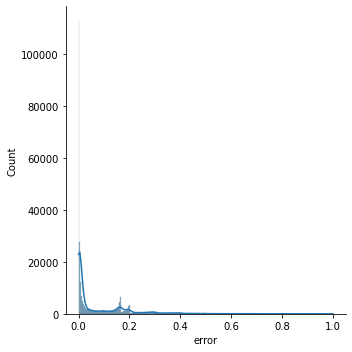

In [43]:
sns.displot(x_test['error'], kde = True)
plt.show()

> CDF

<AxesSubplot:xlabel='error', ylabel='Proportion'>

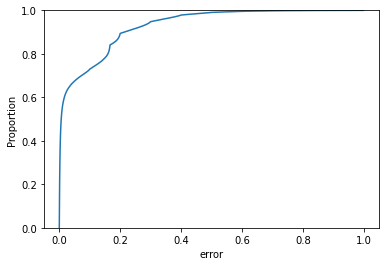

In [44]:
sns.ecdfplot(data=x_test, x="error")

> interquartile range

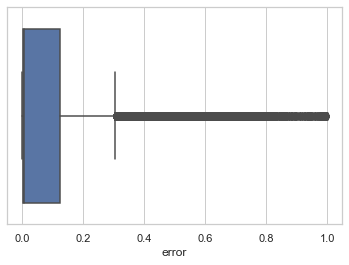

In [46]:
import seaborn as sns
sns.set_theme(style="whitegrid")
# tips = sns.load_dataset("tips")
ax = sns.boxplot(x=x_test['error'])

In [33]:
import plotly.express as px
# df = px.data.tips()
fig = px.box(x_test, y="error")
fig.show()

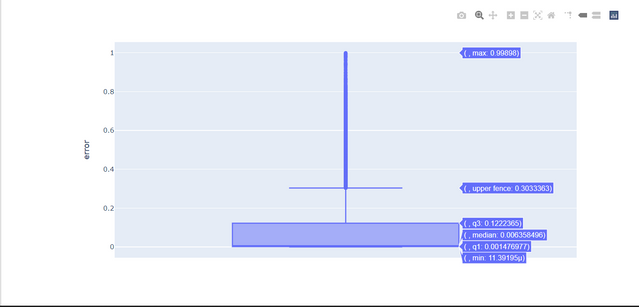

In [34]:
# <a href="https://ibb.co/NthBCCL"><img src="https://i.ibb.co/mbsWTTH/Screenshot-421.png" alt="Screenshot-421" border="0"></a>
from IPython import display
# <a href="https://ibb.co/WKKNZrw"><img src="https://i.ibb.co/BssHbhx/train-example-1.png" alt="train-example-1" border="0"></a>
display.Image("https://i.ibb.co/mbsWTTH/Screenshot-421.png")

> <b> there are some point where loss is almost 1.<b> so we have to handle understand this comment where model is failing.

> ### 2. Calculating some statistics 

In [39]:
import numpy as np
# First quartile (Q1)
Q1 = np.percentile(x_test['error'], 25, interpolation = 'midpoint')    
# Third quartile (Q3)
Q3 = np.percentile(x_test['error'], 75, interpolation = 'midpoint')  
print('CDF at Q3 :',Q3)

CDF at Q3 : 0.12223651160796482


> the above values  0.1222365 represent, 75 parcent of data having error=< 0.1222


> Lets dig deep 

In [42]:
for i in range (75,101):
    IQR=np.percentile(x_test['error'], i, interpolation = 'midpoint')   
    print(i,'percentile :',IQR)

75 percentile : 0.12223651160796482
76 percentile : 0.13244548564155895
77 percentile : 0.1413982690622409
78 percentile : 0.14876405776788787
79 percentile : 0.1551988820234934
80 percentile : 0.1595652231325706
81 percentile : 0.16241151086675623
82 percentile : 0.16424485218400756
83 percentile : 0.16552367268983895
84 percentile : 0.166466221800268
85 percentile : 0.17736880145967007
86 percentile : 0.18655002432564896
87 percentile : 0.19296488760075733
88 percentile : 0.19680280203465375
89 percentile : 0.1991446790227201
90 percentile : 0.21316708922386168
91 percentile : 0.23482051640748977
92 percentile : 0.2567388936820807
93 percentile : 0.2766085142269731
94 percentile : 0.2919784505851567
95 percentile : 0.30710379853844644
96 percentile : 0.34211359918117523
97 percentile : 0.37775194346904756
98 percentile : 0.4114273886450312
99 percentile : 0.49538200511597097
100 percentile : 0.9989801601041108


> * there are some data point where error is too high.
* so we are going check that comments manually and understand for which type of comment it gives high error, we can treat this  data point as outlier.
* we can also remove this type of data from training , to make sure that model shouldn't get confuse with that data point.
* apart from that model is really performing well.

> percentage of data point which having error => 0.5

In [50]:
precentage = (len(x_test[x_test['error'] >= 0.55])/len(x_test))*100
number = len(x_test[x_test['error'] >= 0.55])
print('precentage:',precentage)
print('number :',number)

precentage: 0.6736415944951951
number : 1817


>there are less than 1 percent data which having error >=0.55 

In [57]:
error_data = x_test[x_test['error'] >= 0.55]

> ### 3. analysing data

In [60]:
error_data_ = error_data.sample(10)

In [61]:
error_data_

,comment_text,comment_text_pre,class,target,asian,atheist,bisexual,black,buddhist,christian,...,other_gender,other_race_or_ethnicity,other_religion,other_sexual_orientation,physical_disability,psychiatric_or_mental_illness,transgender,white,predicted target,error
1443996,And the Dumbs will commence obstructing.\nGo D...,commence obstructing go never interrupt enemy ...,toxic,1.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.071642,0.928358
344934,It's just goddamn beyond everything. \nWhat's...,goddamn beyond everything mean leading know wo...,toxic,0.700000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.059290,0.640710
1120931,Islamic terrorism is best combated with the he...,islamic terrorism best combated help local mus...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.881916,0.881916
1189751,"Which sewer do you live in, Stewart?",sewer live stewart,toxic,0.800000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.015884,0.784116
139024,And the number of wars you've been involved wi...,number wars involved personal include not mean...,toxic,1.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.322645,0.677355
485457,Check the GDP data. It's 7% (the indirect BS ...,check gdp data indirect bs huge stretch state ...,non-toxic,0.166667,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.716731,0.550064
1106106,We have become such sissies under the guise of...,become sissies guise safety good lord ancestor...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.813970,0.813970
1473175,Time to vote this ass-hat outta office ...,time vote outta office,toxic,0.875000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.200337,0.674663
1635117,The article was about the Chiefs and Broncos a...,article chiefs broncos insight bronco homers c...,toxic,1.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.005798,0.994202
1268207,A sidewalk is an improvement within a public r...,sidewalk improvement within public like road b...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.826730,0.826730


In [72]:
for index, row in error_data_.iterrows():
    print ('original text :',row["comment_text"],'\n')
    print('preprocesed text:',row['comment_text_pre'],'\n')
    print('original score:',row['target'],'\n')
    print('predicted score:',row['predicted target'],'\n')
    print('error model made:',row['error'],'\n')
    print('\n','*'*100,'\n\n')

original text : And the Dumbs will commence obstructing.
Go Dumbs!
Never interrupt your enemy when they are making a mistake. 

preprocesed text: commence obstructing go never interrupt enemy making mistake 

original score: 1.0 

predicted score: 0.0716421827673912 

error model made: 0.9283578172326088 


 **************************************************************************************************** 


original text : It's just goddamn beyond everything.  
What's it mean? What's it leading to?

  You know, if you'd have told me 20 years ago.
I'd see children walking the streets of our Texas towns..with green hair, bones in their noses...

 I just flat-out
wouldn't have believed you.

 Signs and wonders.

 But I think once you quit hearing "sir"
and "ma'am," the rest is soon to foller.

  Oh, it's the tide.
- Yeah.

 It's the dismal tide.
It is not the one thing.

Not the one thing.

~ from world weary Sheriff  Ed Tom Bell ( Tommy Lee Jones ) in conversation with a fellow older 

> ## Observation:
1. seems like model not preserving positional encodeing in better way.
2. if comment contains identity word , or bad word , model gives high weightage to that sentense.
3. if two identity occure one by another in that case(this happen bcoz of preprocessing  where intermidate word get drop due to some reasons like OOV,) model give high weights to that words.
4. in data there are most of comment are informal, after preprocessing , which may turn into (partially) formal or different from original comment, in this case model may loose some information.
 

> ### 4. Now lets check how model is handling comments where identity group are present.

> Toxic 

In [73]:
x_test.columns

Index(['comment_text', 'comment_text_pre', 'class', 'target', 'asian',
       'atheist', 'bisexual', 'black', 'buddhist', 'christian', 'female',
       'heterosexual', 'hindu', 'homosexual_gay_or_lesbian',
       'intellectual_or_learning_disability', 'jewish', 'latino', 'male',
       'muslim', 'other_disability', 'other_gender', 'other_race_or_ethnicity',
       'other_religion', 'other_sexual_orientation', 'physical_disability',
       'psychiatric_or_mental_illness', 'transgender', 'white',
       'predicted target', 'error'],
      dtype='object')

In [82]:
toxic = x_test[((error_data['asian']==1 )|(error_data['atheist']==1 )|(error_data['bisexual']==1 )|(error_data['buddhist']==1 )|
              (error_data['christian']==1 )|
              (error_data['heterosexual']==1 )|
              (error_data['homosexual_gay_or_lesbian']==1 )|
              (error_data['intellectual_or_learning_disability']==1 )|
              (error_data['latino']==1 )|
              (error_data['asian']==1 )|
              (error_data['male']==1 )|
              (error_data['muslim']==1 )|
              (error_data['other_disability']==1 )|
              (error_data['other_gender']==1 )|
              (error_data['other_race_or_ethnicity']==1 )|
              (error_data['physical_disability']==1 )|
              (error_data['psychiatric_or_mental_illness']==1 )|
              (error_data['transgender']==1 )|
              (error_data['white']==1 ))& (x_test['class']=='toxic')]

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [83]:
toxic

,comment_text,comment_text_pre,class,target,asian,atheist,bisexual,black,buddhist,christian,...,other_gender,other_race_or_ethnicity,other_religion,other_sexual_orientation,physical_disability,psychiatric_or_mental_illness,transgender,white,predicted target,error
1205253,"Ah, right, the Barker lady is going to attend ...",ah right barker lady going attend studies clas...,toxic,1.000000,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.003825,0.996175
157765,"The ""homeless"" are:\n\nThe Mentally ill,\nDrug...",homeless mentally ill drug addicts alcoholics ...,toxic,1.000000,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0.011282,0.988718
562580,WOW! Am I to think you do all those things? I ...,wow think things certain hypocrite wrote commo...,toxic,1.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.013970,0.986030
1657556,Instead of trying to unite the country our pri...,instead trying unite country prime minister tr...,toxic,1.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.039974,0.960026
1621241,What absolute drivel. Obvious this person know...,absolute drivel obvious person knows nothing g...,toxic,1.000000,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0.052030,0.947970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
813154,The article itself is hate-filled and replete...,article replete rhetoric whilst claiming autho...,toxic,0.600000,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0.044423,0.555577
81522,People forget that Muhammad Ali stated on nume...,people forget muhammad ali stated numerous occ...,toxic,0.700000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0.145868,0.554132
1091172,All I know is that I was watching coverage on ...,know watching coverage bbc hours attack interv...,toxic,0.600000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.048884,0.551116
286798,Traditional values like a thrice-married presi...,traditional values like president cheated wive...,toxic,0.600000,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0.048936,0.551064


In [84]:
toxic_ = toxic.sample(10)

In [85]:
toxic_

,comment_text,comment_text_pre,class,target,asian,atheist,bisexual,black,buddhist,christian,...,other_gender,other_race_or_ethnicity,other_religion,other_sexual_orientation,physical_disability,psychiatric_or_mental_illness,transgender,white,predicted target,error
549282,Free zones in their country is the answer - th...,free zones country answer way easily return no...,toxic,0.700000,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0.055773,0.644227
1266327,The fact that transgender people need medical ...,fact transgender people need medical treatment...,toxic,0.700000,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0.028344,0.671656
354596,"WHO ARE YOU TRYING TO KID, 50% OF CANADIAN BOR...",trying kid canadian born husband get divorced ...,toxic,0.600000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0.016993,0.583007
1207296,Chinese law for Chinese. Human rights for huma...,chinese law chinese human rights humans see no...,toxic,0.600000,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.003042,0.596958
1020642,The issue is the ability to distinguish betwee...,issue ability distinguish join vast majority i...,toxic,0.600000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.042444,0.557556
820952,"""Globalist” refers to theories of a conspiracy...",globalist refers theories conspiracy elites ma...,toxic,0.600000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0.016765,0.583235
1695358,Trudeau has his pat answers for each situation...,trudeau pat answers situation instead confront...,toxic,0.909091,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.119993,0.789097
1045701,"The technical term for an atheist who ""stands ...",technical term atheist stands islam,toxic,0.871429,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0.229506,0.641923
575262,The arrogance of the Australian Prime Minister...,arrogance australian prime minister ridiculous...,toxic,0.700000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.032775,0.667225
1091172,All I know is that I was watching coverage on ...,know watching coverage bbc hours attack interv...,toxic,0.600000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.048884,0.551116


> Non toxic

In [86]:
for index, row in toxic_.iterrows():
    print ('original text :',row["comment_text"],'\n')
    print('preprocesed text:',row['comment_text_pre'],'\n')
    print('original score:',row['target'],'\n')
    print('predicted score:',row['predicted target'],'\n')
    print('error model made:',row['error'],'\n')
    print('\n','*'*100,'\n\n')

original text : Free zones in their country is the answer - that way they can easily return and will not remain a burden on the ones who actually work in America , so many people whine about this don't pay any taxes ,  and sorry but I'd take Christians any day over a group of people who are taught that those in the West are Devils and need their heads cut off 

preprocesed text: free zones country answer way easily return not remain burden ones actually work america many people whine not pay taxes sorry would take christians day group people taught west devils need heads cut 

original score: 0.7 

predicted score: 0.05577310174703598 

error model made: 0.644226898252964 


 **************************************************************************************************** 


original text : The fact that transgender people need medical treatment for their condition tells it all.  Normal people come either male or female and require no medical treatment to stay that way. 

preprocese

In [88]:
non_toxic = x_test[((error_data['asian']==1 )|(error_data['atheist']==1 )|(error_data['bisexual']==1 )|(error_data['buddhist']==1 )|
              (error_data['christian']==1 )|
              (error_data['heterosexual']==1 )|
              (error_data['homosexual_gay_or_lesbian']==1 )|
              (error_data['intellectual_or_learning_disability']==1 )|
              (error_data['latino']==1 )|
              (error_data['asian']==1 )|
              (error_data['male']==1 )|
              (error_data['muslim']==1 )|
              (error_data['other_disability']==1 )|
              (error_data['other_gender']==1 )|
              (error_data['other_race_or_ethnicity']==1 )|
              (error_data['physical_disability']==1 )|
              (error_data['psychiatric_or_mental_illness']==1 )|
              (error_data['transgender']==1 )|
              (error_data['white']==1 ))& (x_test['class']=='non-toxic')]

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [89]:
non_toxic

,comment_text,comment_text_pre,class,target,asian,atheist,bisexual,black,buddhist,christian,...,other_gender,other_race_or_ethnicity,other_religion,other_sexual_orientation,physical_disability,psychiatric_or_mental_illness,transgender,white,predicted target,error
45585,Are you Muslim? And what show does Burke have...,muslim show burke never heard not experienced ...,non-toxic,0.000000,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0.911208,0.911208
1053220,"Hey Jerk, go back to the 1st 3 points. 1) Lack...",hey jerk go back st points lacked professional...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.895813,0.895813
1120931,Islamic terrorism is best combated with the he...,islamic terrorism best combated help local mus...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.881916,0.881916
1581270,Hmm. Where are the usual commenters pointing o...,hmm usual commenters pointing western countrie...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.864047,0.864047
543311,Anyone who supports unfettered illegal immigra...,anyone supports unfettered illegal immigration...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.849674,0.849674
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134776,"""And when the truth is know, most homosexuals ...",truth know homosexuals encountered form sexual...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.561867,0.561867
1328375,It however a fault to presume authority on any...,however fault presume authority ignorant case ...,non-toxic,0.000000,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0.560702,0.560702
1331997,Yep good men ( congress) fail to act evil ( Ch...,yep good men congress fail act evil chump prevail,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.558447,0.558447
1804852,Xi and his comrades must be smirking over Trum...,xi comrades must smirking visit months saying ...,non-toxic,0.300000,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.856247,0.556247


In [90]:
non_toxic_ = non_toxic.sample(10)

In [91]:
non_toxic_

,comment_text,comment_text_pre,class,target,asian,atheist,bisexual,black,buddhist,christian,...,other_gender,other_race_or_ethnicity,other_religion,other_sexual_orientation,physical_disability,psychiatric_or_mental_illness,transgender,white,predicted target,error
39466,"Ah yes, I remember now: You equate kindness t...",ah yes remember equate kindness animals racism...,non-toxic,0.166667,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0.720426,0.553760
667450,"So, let us assume that Milo has an excuse for ...",let us assume milo excuse views gay love wonde...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.590826,0.590826
528428,"You wrote, ""So what exactly were they marching...",wrote exactly marching prove hypocrites filthy...,non-toxic,0.400000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.977573,0.577573
398775,Just like the hundreds of mass shootings in th...,like hundreds mass shootings us every year day...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0.708424,0.708424
1379875,OMG give it a rest already......and just what ...,omg give rest called women kill men,non-toxic,0.100000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.905280,0.805280
1292751,The author forgot to mention a few things. The...,author forgot mention things first thing socal...,non-toxic,0.200000,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0.803432,0.603432
239427,the numbers of bulls shot and left to rot is a...,numbers bulls shot left rot disgrace state yea...,non-toxic,0.000000,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.690646,0.690646
980138,"Friday evening, after the triumphant vote, Kri...",friday evening triumphant vote kristyn wong ta...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0.580800,0.580800
1482062,It's pretty hilarious how threatening an intel...,pretty hilarious threatening intelligent woman...,non-toxic,0.203390,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.792358,0.588968
1053220,"Hey Jerk, go back to the 1st 3 points. 1) Lack...",hey jerk go back st points lacked professional...,non-toxic,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.895813,0.895813


In [92]:
for index, row in non_toxic_.iterrows():
    print ('original text :',row["comment_text"],'\n')
    print('preprocesed text:',row['comment_text_pre'],'\n')
    print('original score:',row['target'],'\n')
    print('predicted score:',row['predicted target'],'\n')
    print('error model made:',row['error'],'\n')
    print('\n','*'*100,'\n\n')

original text : Ah yes, I remember now:  You equate kindness to animals with racism.  I believe you've made comments in the past to the effect that those outraged at acts of cruelty to animals are necessarily racist.  You're too smart to have that be anything other than a deliberate fallacy, so I can only assume you hope turn this and other conversations into a conversation about race.

I think the argument goes something like,  Only privileged white people have the luxury to concern themselves with the well-being of animals, and because they do they're racist and guilty of genocide because they SHOULD be devoting all of their time to tackling the only important issue---race awareness and racial injustice.

I don't necessarily agree with Ms Kretzler; I'm just saying you missed her points.  Now I remember why.  

Compassionate people are not a mix of idiots, racists, or genocidal monsters, Fred---In fact, I like to encourage them when I can.  The world needs more of that kind of thing. 

> Observation :
* i observe that whenever there is identity group present, model get confuse and give high weight to that which result in miss classification/unintended bias
* there are some comment where bad word used to make good point. in these cases model fails, model is not understanding sarcasm.
* i think we need some good feature to solve this problem.or more lable data .
* in some cases model reall work well.